## Let's just read one file at a time!  

Extracting EDF parameters from f:\EEG_PROJECT\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
<Info | 8 non-empty values
 bads: []
 ch_names: Cz, Fz, Fp1, F7, F3, FC1, C3, FC5, FT9, T7, CP5, CP1, P3, P7, ...
 chs: 30 EEG, 2 EOG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: 2024-04-09 14:04:26 UTC
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
 subject_info: 3 items (dict)
>
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, z

C:\Users\Admin\AppData\Local\Temp\ipykernel_15628\4211191286.py:19: RuntimeWarning: Not setting positions of 2 eog channels found in montage:
['Fp1', 'Fp2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw.set_montage(montage, on_missing='ignore')
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


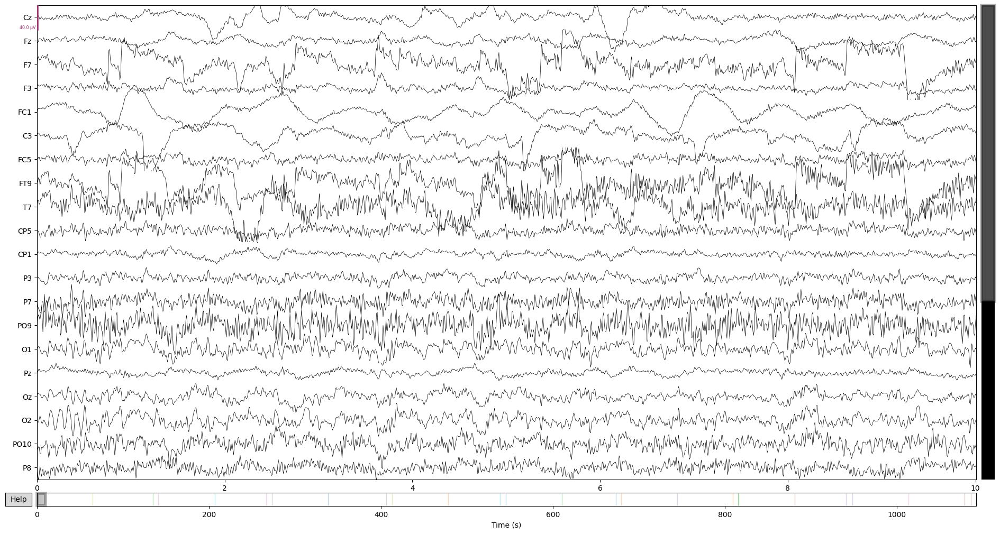

c:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


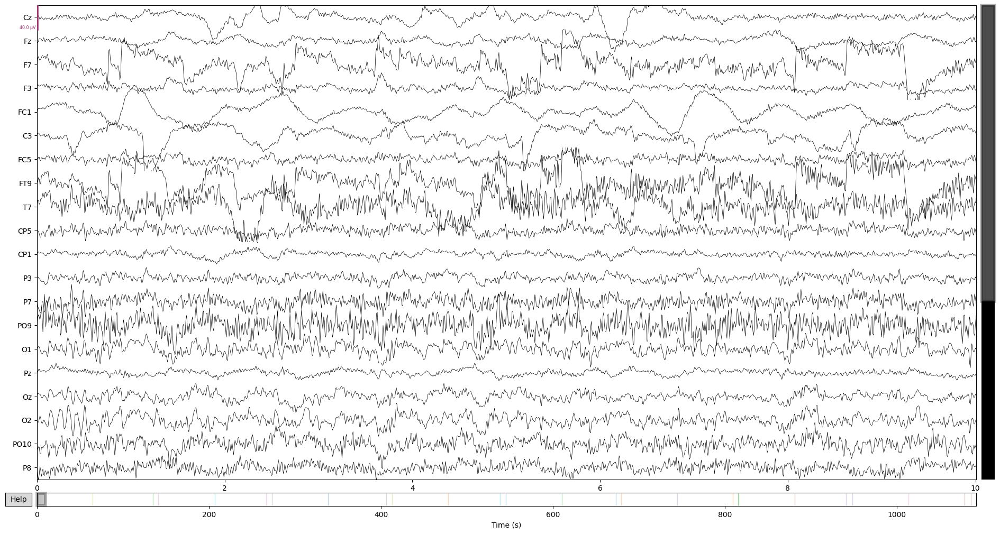

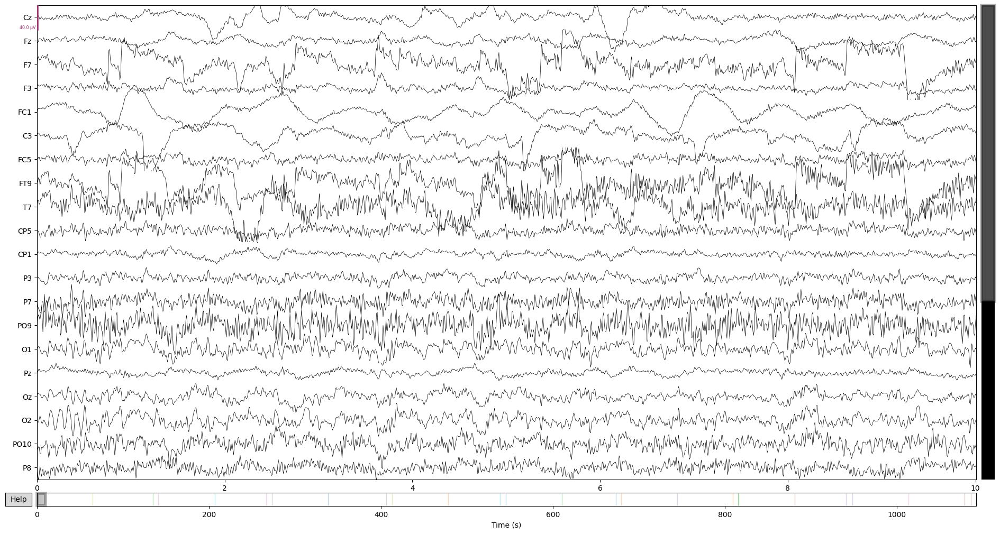

In [20]:
import mne
from mne.preprocessing import ICA
from mne.preprocessing import create_ecg_epochs, create_eog_epochs
import matplotlib.pyplot as plt
from pathlib import Path

## NOTE: I can define all desired channels here, or, I can do it with raw.pick('eeg')
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', eog=['Fp1','Fp2'] ,preload=True, infer_types=True)#, verbose=True

# Select only EEG channels
# raw.pick('eeg') # Getting only eeg channels
raw.pick(eeg_channels)
print(raw.info)
# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.apply_proj()
raw.filter(l_freq=1, h_freq=40)  # Apply band-pass filter
raw.plot(picks=eeg_channels)
raw.apply_hilbert()
raw.plot()
# ecg_epochs = create_ecg_epochs(raw, tmin=-.5, tmax=.5, picks=eeg_channels)


In [4]:
raw.pick('eeg')

Measurement date,"April 09, 2024 14:04:26 GMT"
Experimenter,Unknown
Participant,X
Digitized points,35 points
Good channels,32 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,128.00 Hz
Highpass,1.00 Hz
Lowpass,40.00 Hz


Extracting EDF parameters from f:\EEG_PROJECT\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
EOG channels found: ['Fp1', 'Fp2']
All channels to pick: {'C4', 'FC5', 'T8', 'CP1', 'Fp1', 'PO10', 'FC2', 'FT10', 'P8', 'Pz', 'FC1', 'CP6', 'O1', 'T7', 'PO9', 'F3', 'Cz', 'CP2', 'C3', 'CP5', 'Fp2', 'FT9', 'O2', 'F8', 'P4', 'FC6', 'Fz', 'Oz', 'F7', 'F4', 'P3', 'P7'}
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---

C:\Users\Admin\AppData\Local\Temp\ipykernel_15628\4187734336.py:16: RuntimeWarning: Not setting positions of 2 eog channels found in montage:
['Fp1', 'Fp2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw.set_montage(montage, on_missing='ignore')
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


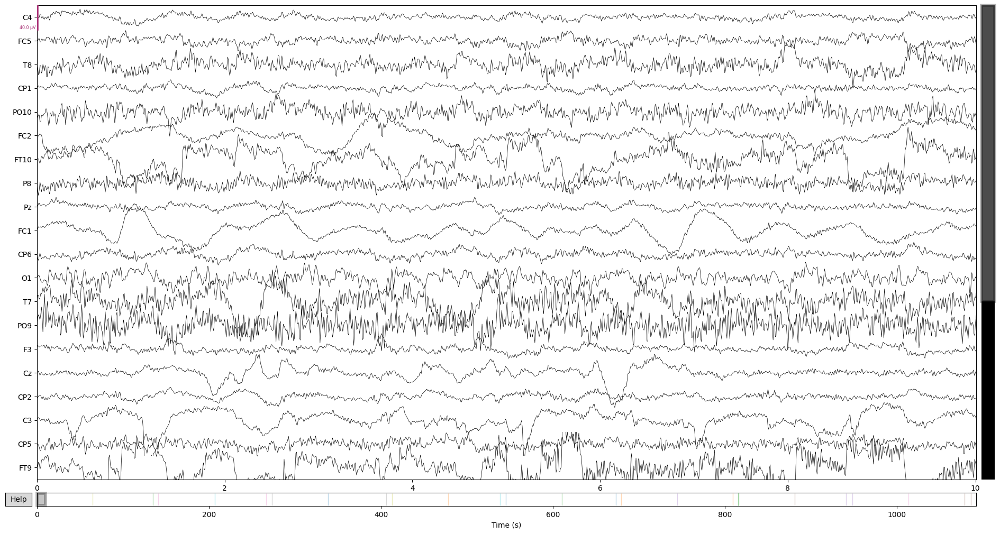

Using EOG channels: Fp1, Fp2
EOG channel index for this subject is: [ 4 20]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel Fp1 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 320 significant peaks
Number of EOG events detected: 320
Not setting metadata
320 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 320 eve

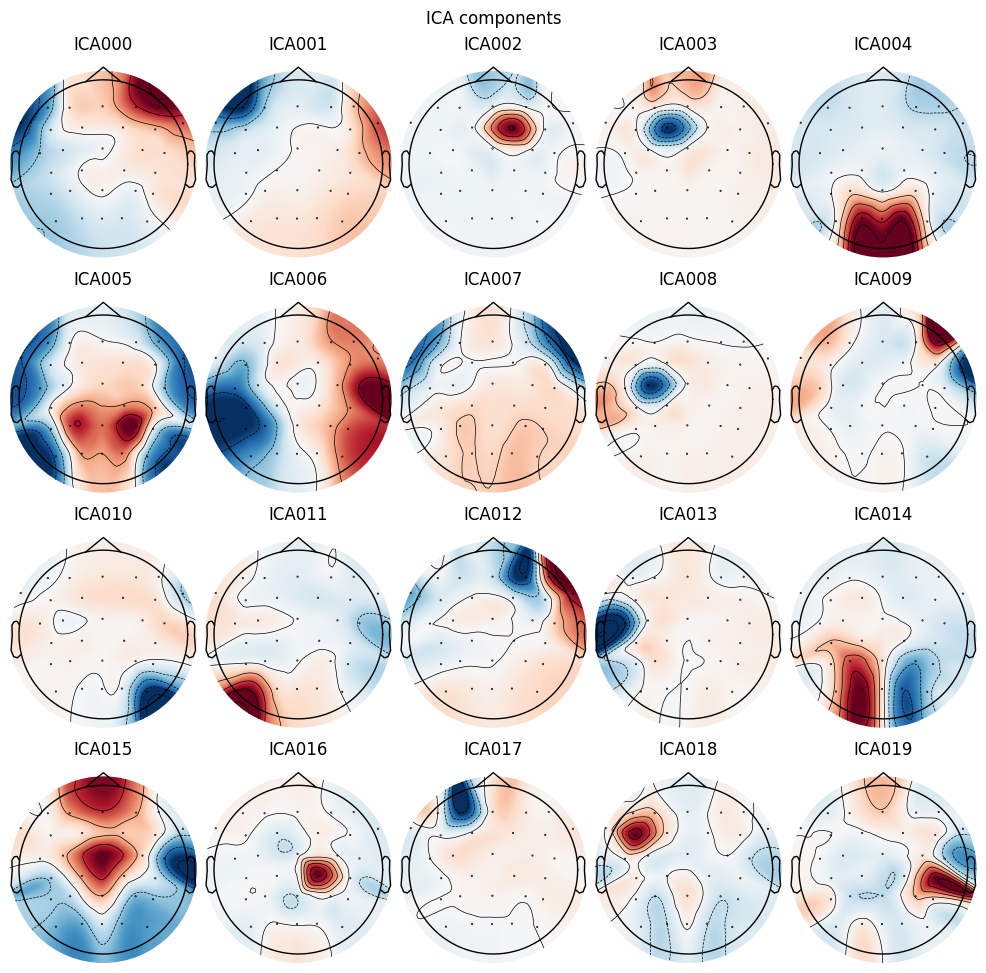

Projections have already been applied. Setting proj attribute to True.


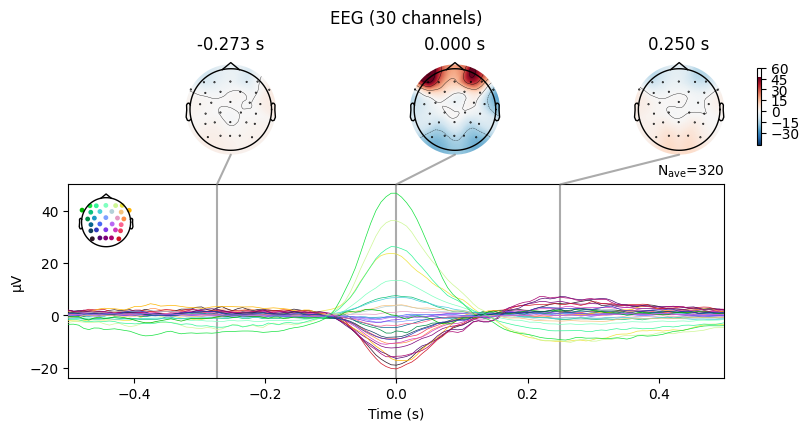

Now plotting hilbert


c:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


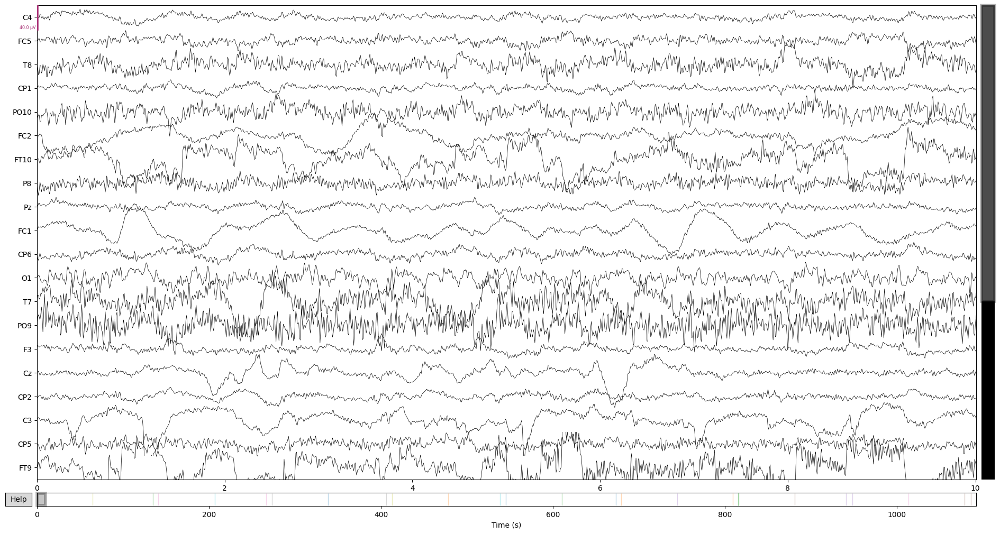

In [37]:
import mne
from mne.preprocessing import ICA, create_ecg_epochs, create_eog_epochs
import matplotlib.pyplot as plt

# Define EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 
                'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 
                'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 
                'F8', 'Fp2']

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', eog=['Fp1','Fp2'] ,preload=True, infer_types=True)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Specify EOG channels (modify based on your data)
eog_channels = ['Fp1', 'Fp2']

# Check if EOG channels are present in raw.info['ch_names']
eog_channels_present = all(chan in raw.info['ch_names'] for chan in eog_channels)

if eog_channels_present:
    print("EOG channels found:", eog_channels)
    
    # # Set EOG channels
    # raw.set_channel_types({'Fp1': 'eeg', 'Fp2': 'eeg'})

    # Select EEG and EOG channels
    all_channels = set(eeg_channels + eog_channels)
    print("All channels to pick:", all_channels)
    
    raw.pick_channels(all_channels)

    # Apply preprocessing steps
    raw.set_eeg_reference('average', projection=True)  # set EEG average reference
    raw.apply_proj()
    raw.filter(l_freq=1, h_freq=40)  # Apply band-pass filter

    # Plot raw data with both EEG and EOG channels
    raw.plot()

    # Create EOG epochs if EOG channels are present
    eog_epochs = create_eog_epochs(raw, tmin=-0.5, tmax=0.5)

    # Example of using ICA for artifact correction
    ica = ICA(n_components=20, random_state=97, max_iter=800)
    ica.fit(raw)
    ica.plot_components()

    # Plot EOG epochs
    eog_epochs.average().plot_joint()
    print('Now plotting hilbert')
    # Plot filtered and Hilbert transformed raw data
    raw.apply_hilbert()
    raw.plot()

    # Example of creating ECG epochs
    #ecg_epochs = create_ecg_epochs(raw, tmin=-0.5, tmax=0.5, picks=eeg_channels) # NOTE: Not able to be done without meg channels

else:
    print("EOG channels not found in the data. Skipping EOG-related processing.")

plt.show()


Extracting EDF parameters from f:\EEG_PROJECT\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


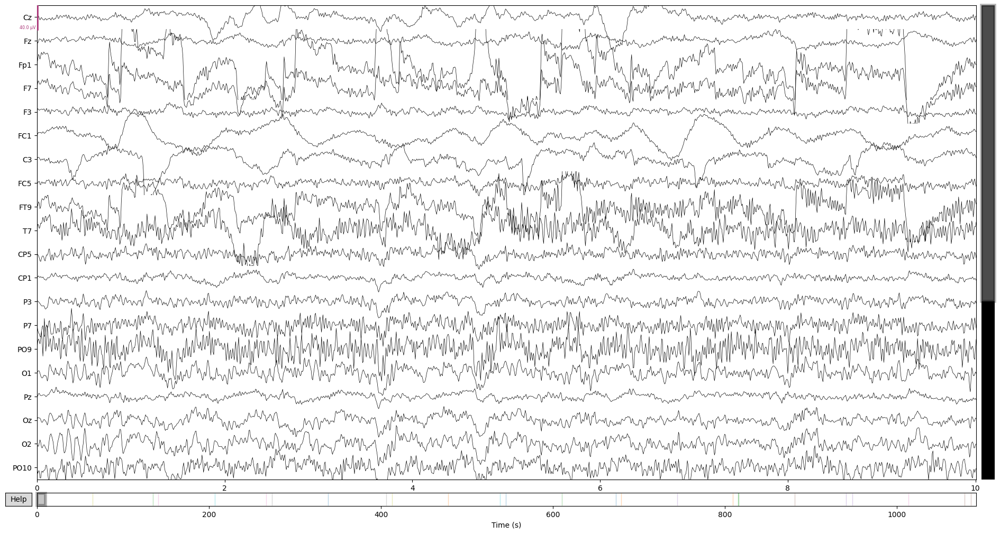

Using EOG channels: Fp1, Fp2
EOG channel index for this subject is: [ 2 31]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel Fp1 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 267 significant peaks
Number of EOG events detected: 267
Not setting metadata
267 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 267 eve

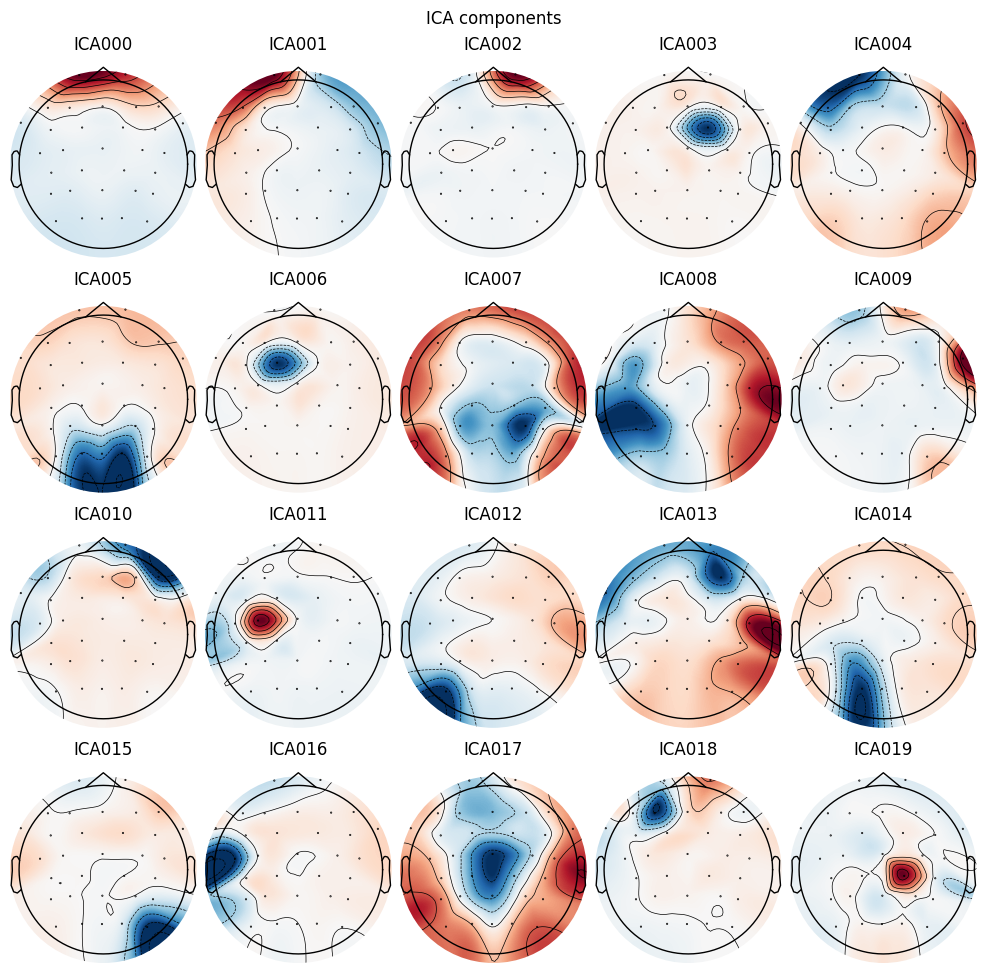

Projections have already been applied. Setting proj attribute to True.


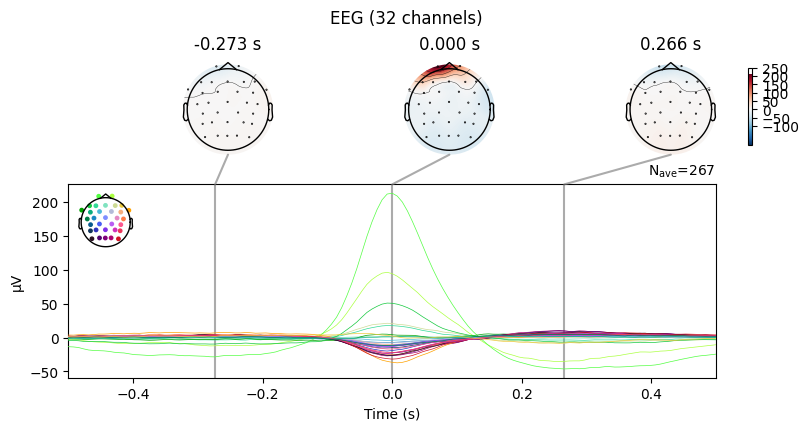

c:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


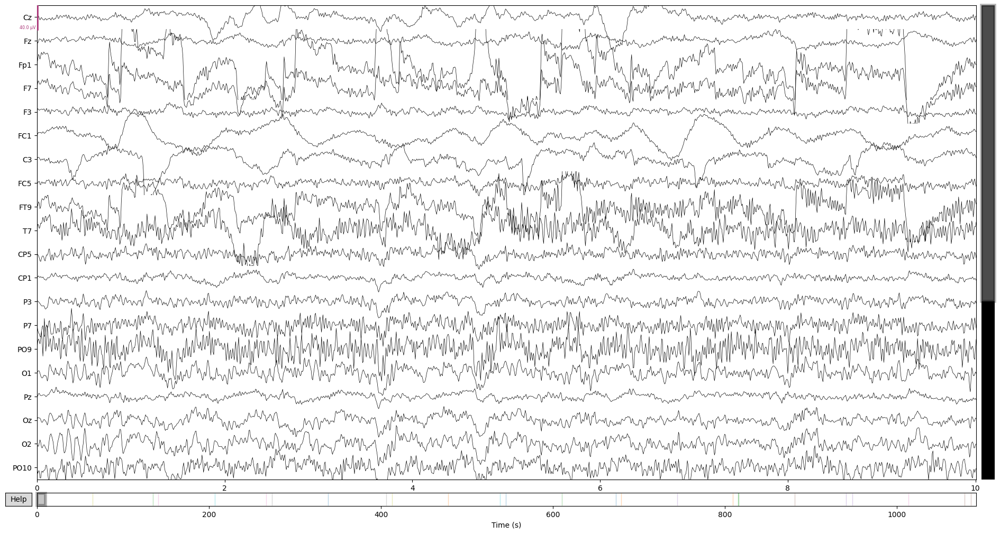

ValueError: Unable to generate artificial ECG channel

In [4]:
import mne
from mne.preprocessing import ICA, create_ecg_epochs, create_eog_epochs
import matplotlib.pyplot as plt

# Define EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 
                'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 
                'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 
                'F8', 'Fp2']

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', preload=True, infer_types=True)

# Specify EOG channels (modify based on your data)




# Select EEG and EOG channels
raw.pick_channels(eeg_channels)

# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.apply_proj()
raw.filter(l_freq=1, h_freq=40)  # Apply band-pass filter

# Plot raw data with both EEG and EOG channels
raw.plot()

# Create EOG epochs if EOG channels are present
eog_epochs = create_eog_epochs(raw,ch_name=['Fp1','Fp2'], tmin=-0.5, tmax=0.5)

# Example of using ICA for artifact correction
ica = ICA(n_components=20, random_state=97, max_iter=800)
ica.fit(raw)
ica.plot_components()

# Plot EOG epochs
eog_epochs.average().plot_joint()

# Plot filtered and Hilbert transformed raw data
raw.apply_hilbert()
raw.plot()

# Example of creating ECG epochs
ecg_epochs = create_ecg_epochs(raw, tmin=-0.5, tmax=0.5, picks=eeg_channels)

plt.show()


## EOG epochs with hilbert

Extracting EDF parameters from f:\EEG_PROJECT\EDF+\Zacker\Zacker.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 139775  =      0.000 ...  1091.992 secs...
EOG channels found: ['Fp1', 'Fp2']
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Created an SSP operator (subspace dimension = 1)
1 projection items activated
SSP projectors applied...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper 

C:\Users\Admin\AppData\Local\Temp\ipykernel_15628\2546201285.py:20: RuntimeWarning: Not setting positions of 2 eog channels found in montage:
['Fp1', 'Fp2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  raw.set_montage(montage, on_missing='ignore')
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


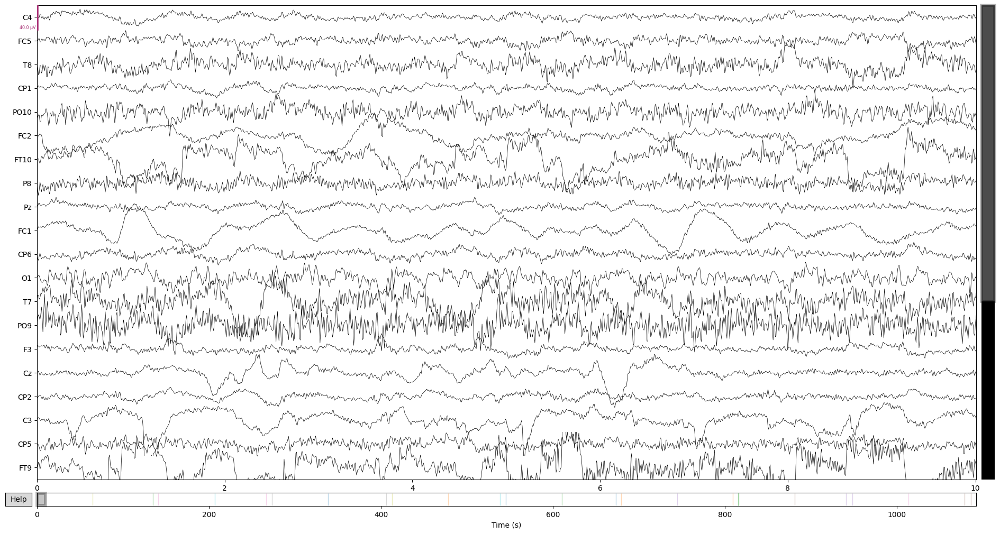

Using EOG channels: Fp1, Fp2
EOG channel index for this subject is: [ 4 20]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel Fp1 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 320 significant peaks
Number of EOG events detected: 320
Not setting metadata
320 matching events found
No baseline correction applied
Created an SSP operator (subspace dimension = 1)
1 projection items activated
Using data from preloaded Raw for 320 eve

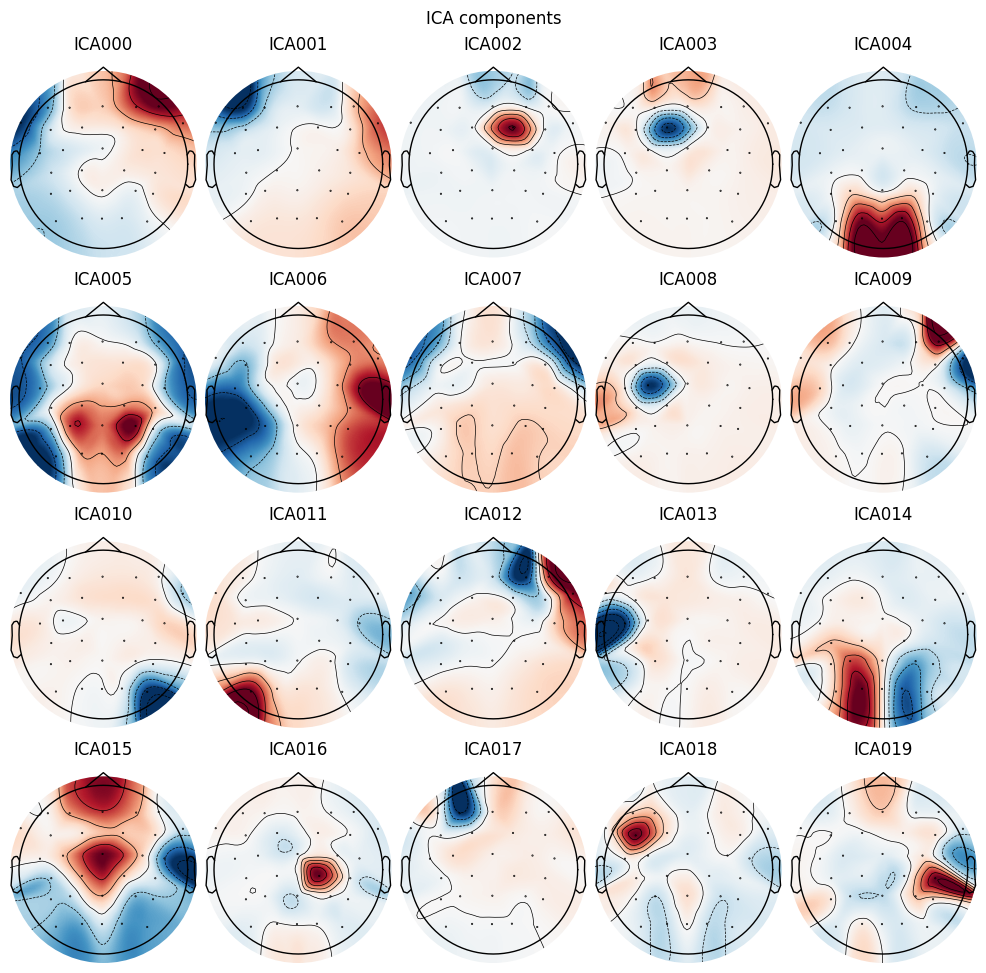

Projections have already been applied. Setting proj attribute to True.


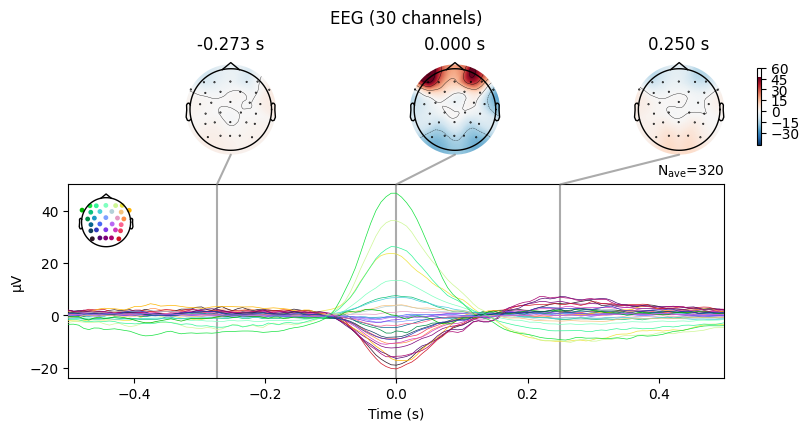

Creating RawArray with float64 data, n_channels=32, n_times=139776
    Range : 0 ... 139775 =      0.000 ...  1091.992 secs
Ready.


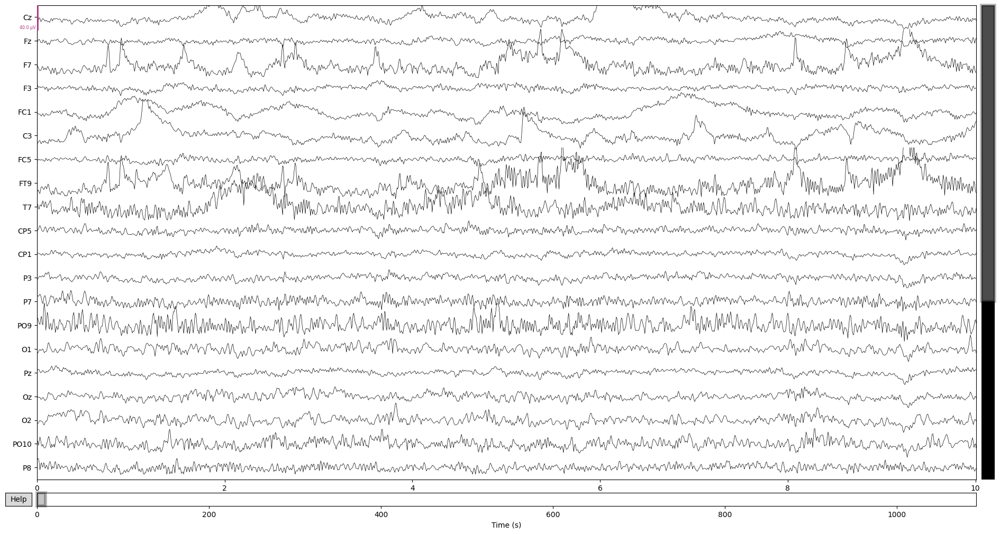

In [46]:
import mne
from mne.preprocessing import ICA, create_ecg_epochs, create_eog_epochs
import matplotlib.pyplot as plt
import numpy as np

# Define EEG channels
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 
                'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 
                'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 
                'F8', 'Fp2']
# Specify EOG channels (modify based on your data)
eog_channels = ['Fp1', 'Fp2']
all_channels = list(set(eeg_channels + eog_channels))

# Read your EDF file
raw = mne.io.read_raw_edf(r'EDF+\Zacker\Zacker.edf', eog=['Fp1', 'Fp2'], preload=True, infer_types=True)
raw.pick(all_channels)
# Set montage
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')


print("EOG channels found:", eog_channels)

# Set EOG channels


# Select EEG and EOG channels
# all_channels = eeg_channels + eog_channels
# print("All channels to pick:", all_channels)

# raw.pick_channels(all_channels)

# Apply preprocessing steps
raw.set_eeg_reference('average', projection=True)  # set EEG average reference
raw.apply_proj()
raw.filter(l_freq=1, h_freq=40)  # Apply band-pass filter

# Plot raw data with both EEG and EOG channels
raw.plot()

# Create EOG epochs if EOG channels are present
eog_epochs = create_eog_epochs(raw, tmin=-0.5, tmax=0.5)
raw.pick(eeg_channels)
# Example of using ICA for artifact correction
ica = ICA(n_components=20, random_state=97, max_iter=800)
ica.fit(raw)
ica.plot_components()

# Plot EOG epochs
eog_epochs.average().plot_joint()

# Apply the Hilbert transform
raw_hilbert = raw.copy().apply_hilbert()

# Extract the magnitude of the Hilbert-transformed signal
raw_hilbert_data = raw_hilbert.get_data()
raw_hilbert_magnitude = np.abs(raw_hilbert_data)

# Create a new Raw object with the magnitude data for plotting
raw_hilbert_magnitude = mne.io.RawArray(raw_hilbert_magnitude, raw_hilbert.info)

# Plot the magnitude of the Hilbert-transformed signal
raw_hilbert_magnitude.plot()

# # Example of creating ECG epochs
# ecg_epochs = create_ecg_epochs(raw, tmin=-0.5, tmax=0.5, picks=eeg_channels)


plt.show()
